## Warning: This notebook contains medical images that could be disturbing

In [17]:
import random
from pathlib import Path

import faiss
import numpy as np
import polars as pl
import torch
import torch.nn as nn
import torchvision.models as models
from IPython.display import display, HTML
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, Resize, ToTensor
from tqdm import tqdm

In [2]:
SEED = 492
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

In [3]:
data_path = Path("../../data/ISIC")
image_path = data_path / "ISIC_2024_Training_Input"
ground_truth_path = data_path / "ISIC_2024_Training_GroundTruth.csv"
metadata_path = data_path / "metadata.csv"
model_path = Path("../../models")

In [4]:
device = torch.device("cuda")

In [5]:
ground_truth_df = pl.read_csv(ground_truth_path)
metadata_df = pl.read_csv(metadata_path)

df = ground_truth_df.join(metadata_df, on="isic_id", how="inner").with_columns(
    (pl.lit(str(image_path)) + "/" + pl.col("isic_id").cast(pl.Utf8) + ".jpg").alias("image_path")
)

patient_stats = df.group_by("patient_id").agg(pl.col("malignant").max().alias("has_malignant")).sort("patient_id")

train_p, val_p = train_test_split(
    patient_stats, test_size=0.1, random_state=SEED, stratify=patient_stats["has_malignant"]
)

train_ids = train_p["patient_id"].to_list()
val_ids = val_p["patient_id"].to_list()

train_df = df.filter(pl.col("patient_id").is_in(train_ids))
val_df = df.filter(pl.col("patient_id").is_in(val_ids))

In [6]:
tab_categorical = ["sex", "anatom_site_general"]
tab_numerical = ["age_approx", "clin_size_long_diam_mm", "tbp_lv_areaMM2", "tbp_lv_eccentricity"]

median_age = train_df["age_approx"].median()
mode_sex = train_df["sex"].drop_nulls().mode()[0]

train_df = train_df.with_columns(
    pl.col("age_approx").fill_null(median_age),
    pl.col("sex").fill_null(mode_sex),
    pl.col("anatom_site_general").fill_null("unknown"),
)

val_df = val_df.with_columns(
    pl.col("age_approx").fill_null(median_age),
    pl.col("sex").fill_null(mode_sex),
    pl.col("anatom_site_general").fill_null("unknown"),
)

In [7]:
exprs = []
for c in tab_numerical:
    exprs.append(pl.col(c).mean().alias(f"{c}_mean"))
    exprs.append(pl.col(c).std().alias(f"{c}_std"))

num_stats = train_df.select(exprs)

for col in tab_numerical:
    mean = num_stats.item(0, f"{col}_mean")
    std = num_stats.item(0, f"{col}_std")
    train_df = train_df.with_columns(((pl.col(col) - mean) / std).alias(col))
    val_df = val_df.with_columns(((pl.col(col) - mean) / std).alias(col))

tab_features = list(tab_numerical)

for col in tab_categorical:
    categories = train_df[col].unique().to_list()
    for cat in categories:
        col_name = f"{col}_{cat}"
        train_df = train_df.with_columns((pl.col(col) == cat).cast(pl.Int8).alias(col_name))
        val_df = val_df.with_columns((pl.col(col) == cat).cast(pl.Int8).alias(col_name))
        tab_features.append(col_name)

train_df = train_df.drop(tab_categorical)
val_df = val_df.drop(tab_categorical)

In [8]:
class MultimodalModel(nn.Module):
    def __init__(self, tab_dim):
        super().__init__()
        self.image_encoder = models.resnet50(weights=models.ResNet50_Weights.DEFAULT)
        self.image_encoder.fc = nn.Identity()

        self.tab_encoder = nn.Sequential(
            nn.Linear(tab_dim, 128),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(64, 32),
        )

        self.fusion_head = nn.Sequential(
            nn.Linear(2048 + 32, 1024),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(1024, 512),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(512, 1),
        )

    def forward(self, image, tab):
        img_feat = self.image_encoder(image)
        tab_feat = self.tab_encoder(tab)
        combined = torch.cat([img_feat, tab_feat], dim=1)
        return self.fusion_head(combined)

In [9]:
class MultimodalEmbedder(nn.Module):
    def __init__(self, tab_dim):
        super().__init__()
        full_model = MultimodalModel(tab_dim)
        full_model.load_state_dict(torch.load(model_path / "best_hard_neg_model.pt", weights_only=True))
        self.image_encoder = full_model.image_encoder
        self.tab_encoder = full_model.tab_encoder

    def forward(self, image, tab):
        img_feat = self.image_encoder(image)
        tab_feat = self.tab_encoder(tab)
        combined = torch.cat([img_feat, tab_feat], dim=1)
        return torch.nn.functional.normalize(combined, p=2, dim=1)

In [10]:
embedder = MultimodalEmbedder(tab_dim=len(tab_features)).to(device)
embedder.eval()

MultimodalEmbedder(
  (image_encoder): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, bias=True, track_running_stats=True)
        (relu): Re

In [12]:
class ISICMultimodalDataset(Dataset):
    def __init__(self, dataframe: pl.DataFrame, tabular_features: list[str], image_transform):
        self.df = dataframe
        self.tab_features = tabular_features
        self.image_transform = image_transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.row(idx, named=True)
        img = Image.open(row["image_path"]).convert("RGB")
        img = self.image_transform(img)
        tab_data = torch.tensor([row[feat] for feat in self.tab_features], dtype=torch.float32)
        return img, tab_data, row["isic_id"], row["patient_id"], row["malignant"]

In [13]:
val_transform = Compose([Resize((224, 224)), ToTensor()])

train_dataset = ISICMultimodalDataset(train_df, tab_features, val_transform)
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=False)

In [14]:
all_embeddings = []
all_isic_ids = []
all_patient_ids = []
all_malignant = []

with torch.no_grad():
    for images, tabs, isic_ids, patient_ids, malignants in tqdm(train_loader, desc="Extracting Training Embeddings"):
        images, tabs = images.to(device), tabs.to(device)
        embeddings = embedder(images, tabs)
        all_embeddings.append(embeddings.cpu())
        all_isic_ids.extend(isic_ids)
        all_patient_ids.extend(patient_ids)
        all_malignant.extend(malignants.tolist())

all_embeddings = torch.cat(all_embeddings, dim=0).numpy()

Extracting Training Embeddings: 100%|██████████| 2759/2759 [14:06<00:00,  3.26it/s]


In [15]:
all_embeddings = all_embeddings.astype("float32")

malignant_mask = np.array(all_malignant) == 1
benign_mask = np.array(all_malignant) == 0

mal_embeddings = all_embeddings[malignant_mask]
ben_embeddings = all_embeddings[benign_mask]

index_mal = faiss.IndexFlatIP(mal_embeddings.shape[1])
index_mal.add(mal_embeddings)

index_ben = faiss.IndexFlatIP(ben_embeddings.shape[1])
index_ben.add(ben_embeddings)

mal_train_df = train_df.filter(pl.col("malignant") == 1)
ben_train_df = train_df.filter(pl.col("malignant") == 0)

print(f"Malignant Index Size: {index_mal.ntotal}")
print(f"Benign Index Size: {index_ben.ntotal}")

Malignant Index Size: 348
Benign Index Size: 352678


In [16]:
val_dataset = ISICMultimodalDataset(val_df, tab_features, val_transform)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)

val_embeddings = []
val_isic_ids = []
val_patient_ids = []
val_malignant = []

with torch.no_grad():
    for images, tabs, isic_ids, patient_ids, malignants in tqdm(val_loader, desc="Extracting Val Embeddings"):
        images, tabs = images.to(device), tabs.to(device)
        embeddings = embedder(images, tabs)
        val_embeddings.append(embeddings.cpu())
        val_isic_ids.extend(isic_ids)
        val_patient_ids.extend(patient_ids)
        val_malignant.extend(malignants.tolist())

val_embeddings = torch.cat(val_embeddings, dim=0).numpy().astype("float32")

Extracting Val Embeddings: 100%|██████████| 376/376 [01:47<00:00,  3.50it/s]


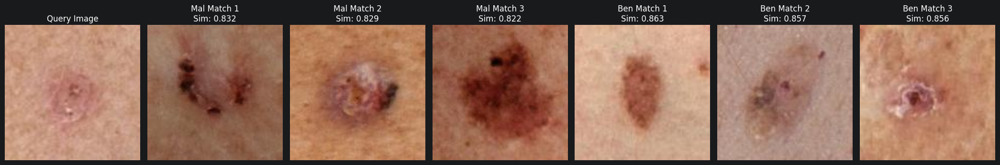

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0119495""","""IP_6856511""",60.0,"""male""","""upper extremity""",5.27,13.26703,0.7450609,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0082829""","""IP_3249371""",80.0,"""female""","""anterior torso""",9.27,40.964534,0.763841,0.831872
"""ISIC_4851249""","""IP_9211554""",65.0,"""female""","""posterior torso""",11.14,75.13605,0.5470122,0.829463
"""ISIC_6784337""","""IP_9847192""",60.0,"""male""","""posterior torso""",13.7,91.33046,0.6119151,0.822407


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9939443""","""IP_3260480""",50.0,"""male""","""posterior torso""",8.87,36.442109,0.804211,0.862797
"""ISIC_2149441""","""IP_8590096""",75.0,"""male""","""posterior torso""",11.62,64.57121,0.7978506,0.856845
"""ISIC_2108101""","""IP_8457418""",65.0,"""female""","""lower extremity""",5.92,16.06305,0.6061567,0.856453


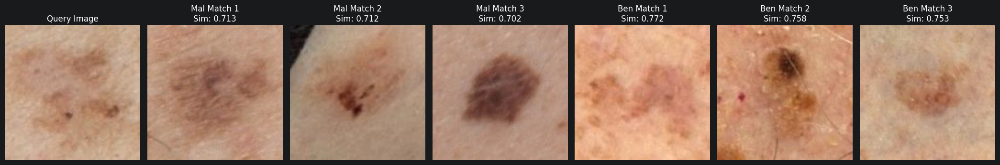

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1063394""","""IP_9324599""",85.0,"""male""","""upper extremity""",13.29,103.0212,0.6741962,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6068699""","""IP_7746572""",80.0,"""male""","""upper extremity""",11.55,72.84669,0.6095133,0.712897
"""ISIC_0521019""","""IP_0199195""",60.0,"""female""","""posterior torso""",8.45,35.541377,0.65762,0.711525
"""ISIC_7316504""","""IP_8313778""",50.0,"""male""","""posterior torso""",9.0,52.07356,0.5644886,0.701554


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4184643""","""IP_5539318""",70.0,"""female""","""lower extremity""",13.74,76.05555,0.8442603,0.77151
"""ISIC_1115739""","""IP_5811816""",85.0,"""male""","""anterior torso""",11.89,52.8054,0.8346037,0.758327
"""ISIC_4559034""","""IP_8557750""",85.0,"""female""","""lower extremity""",7.95,29.83674,0.7954964,0.753053


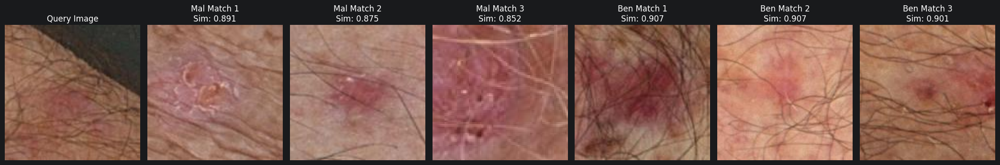

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1164461""","""IP_3371534""",60.0,"""male""","""upper extremity""",1.13,0.769375,0.772838,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9127831""","""IP_5799983""",70.0,"""male""","""posterior torso""",1.9,1.313567,0.9127485,0.890762
"""ISIC_8614100""","""IP_3927284""",55.0,"""male""","""anterior torso""",9.53,36.967536,0.635529,0.875129
"""ISIC_7379567""","""IP_8372519""",65.0,"""male""","""lower extremity""",1.16,0.6755489,0.8505873,0.852215


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9074993""","""IP_5714646""",40.0,"""male""","""upper extremity""",11.1,51.26665,0.8604294,0.907275
"""ISIC_1096924""","""IP_5961877""",75.0,"""male""","""lower extremity""",3.43,6.999437,0.5706271,0.906685
"""ISIC_0325581""","""IP_0658218""",75.0,"""male""","""lower extremity""",2.74,4.57872,0.485238,0.90054


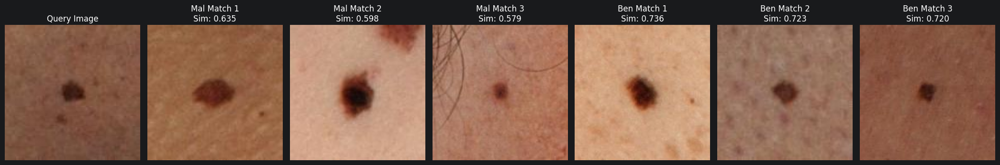

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1623236""","""IP_0023586""",75.0,"""male""","""lower extremity""",2.74,5.760931,0.430875,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4079957""","""IP_2931167""",65.0,"""female""","""posterior torso""",4.8,13.454682,0.658919,0.635312
"""ISIC_6730784""","""IP_0889220""",40.0,"""male""","""anterior torso""",7.0,22.311878,0.761063,0.597528
"""ISIC_9207822""","""IP_4215006""",60.0,"""female""","""head/neck""",2.7,4.897729,0.511768,0.578941


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2879710""","""IP_4849578""",50.0,"""female""","""posterior torso""",4.45,12.797898,0.655592,0.735846
"""ISIC_9390236""","""IP_8979449""",40.0,"""female""","""lower extremity""",2.81,6.86808,0.491548,0.722513
"""ISIC_7481482""","""IP_4717387""",50.0,"""female""","""lower extremity""",2.6,4.747607,0.576681,0.71965


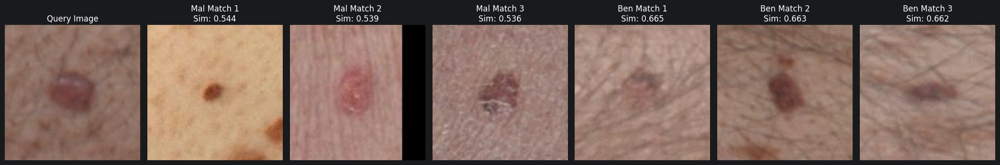

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1721956""","""IP_3921915""",45.0,"""male""","""posterior torso""",6.39,22.687183,0.605732,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3266736""","""IP_6321403""",60.0,"""male""","""upper extremity""",3.01,5.479452,0.6577945,0.544032
"""ISIC_5990594""","""IP_2456971""",60.0,"""male""","""posterior torso""",5.47,14.148996,0.768941,0.538963
"""ISIC_1071492""","""IP_1390102""",40.0,"""female""","""lower extremity""",5.73,15.106024,0.787037,0.536211


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_4787774""","""IP_8989787""",40.0,"""male""","""upper extremity""",6.49,20.97955,0.6905665,0.664561
"""ISIC_5621723""","""IP_8901760""",60.0,"""male""","""posterior torso""",4.77,12.61025,0.7223553,0.66284
"""ISIC_6520297""","""IP_6422845""",70.0,"""male""","""posterior torso""",6.36,15.33121,0.8302588,0.662196


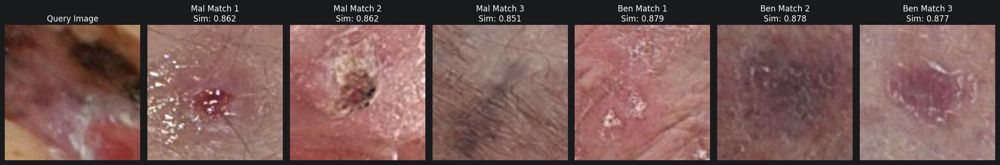

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2027124""","""IP_6413837""",55.0,"""male""","""posterior torso""",2.4,1.651342,0.9494246,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2031355""","""IP_8292126""",55.0,"""male""","""lower extremity""",12.66,86.01989,0.6578067,0.861622
"""ISIC_8966407""","""IP_2732171""",65.0,"""male""","""head/neck""",4.18,13.079377,0.486764,0.861596
"""ISIC_5204454""","""IP_0277335""",55.0,"""male""","""lower extremity""",1.51,1.444924,0.744162,0.851417


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1752095""","""IP_8170065""",60.0,"""male""","""upper extremity""",1.64,1.088384,0.9017209,0.879273
"""ISIC_7680752""","""IP_9688037""",60.0,"""male""","""lower extremity""",18.77,127.6787,0.7922494,0.878276
"""ISIC_6678031""","""IP_9453251""",75.0,"""male""","""lower extremity""",7.58,37.54926,0.5128534,0.877109


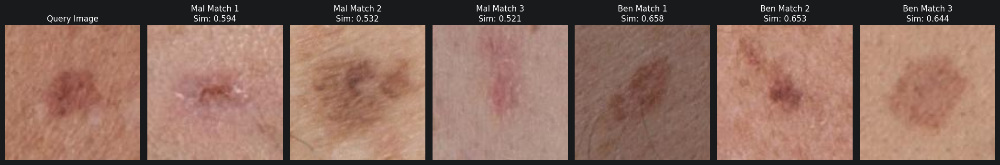

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2746016""","""IP_8352314""",65.0,"""female""","""lower extremity""",7.01,25.57703,0.7048099,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8404669""","""IP_3154471""",70.0,"""male""","""head/neck""",5.48,14.392944,0.780451,0.59361
"""ISIC_6068699""","""IP_7746572""",80.0,"""male""","""upper extremity""",11.55,72.84669,0.6095133,0.531924
"""ISIC_7235721""","""IP_2586665""",50.0,"""female""","""posterior torso""",1.37,1.426159,0.467819,0.521271


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3909519""","""IP_9418573""",50.0,"""male""","""posterior torso""",8.89,28.46688,0.8686395,0.658339
"""ISIC_9886702""","""IP_8721252""",65.0,"""male""","""posterior torso""",5.31,12.7979,0.764895,0.653453
"""ISIC_8853743""","""IP_2676056""",30.0,"""female""","""posterior torso""",9.11,49.596547,0.685468,0.644436


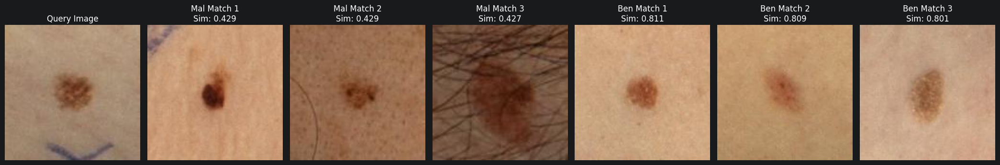

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3377793""","""IP_2506030""",55.0,"""female""","""lower extremity""",4.8,14.787014,0.55214,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_2068746""","""IP_1474479""",70.0,"""male""","""upper extremity""",5.3,13.098142,0.785371,0.429072
"""ISIC_2263885""","""IP_1241473""",35.0,"""male""","""head/neck""",4.2,12.310002,0.435852,0.428514
"""ISIC_0445144""","""IP_0822819""",60.0,"""male""","""head/neck""",9.2,32.370051,0.783424,0.42739


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6370952""","""IP_8834083""",45.0,"""female""","""lower extremity""",3.97,10.5273,0.5018976,0.811133
"""ISIC_0564196""","""IP_9807499""",40.0,"""female""","""posterior torso""",5.21,13.47345,0.7923126,0.809227
"""ISIC_1624418""","""IP_2935407""",65.0,"""female""","""lower extremity""",5.07,16.025521,0.627511,0.800809


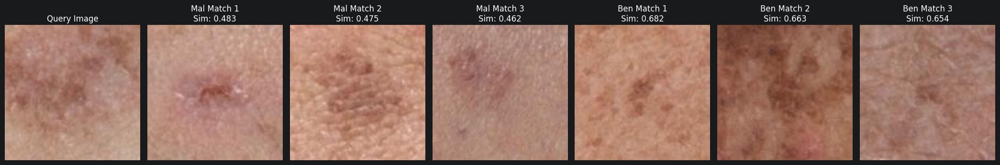

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3398012""","""IP_9324599""",85.0,"""male""","""anterior torso""",2.33,4.165885,0.4858239,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8404669""","""IP_3154471""",70.0,"""male""","""head/neck""",5.48,14.392944,0.780451,0.482978
"""ISIC_8852993""","""IP_9743101""",50.0,"""male""","""posterior torso""",11.72,71.17658,0.6716789,0.474639
"""ISIC_7105211""","""IP_9978624""",55.0,"""female""","""lower extremity""",1.59,1.013323,0.8710382,0.46164


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6975642""","""IP_7770500""",55.0,"""male""","""upper extremity""",5.36,8.406831,0.8902572,0.681606
"""ISIC_7564867""","""IP_7797815""",75.0,"""male""","""anterior torso""",4.49,9.851755,0.6525677,0.662818
"""ISIC_2383450""","""IP_5092630""",70.0,"""female""","""lower extremity""",2.57,3.734284,0.755672,0.654154


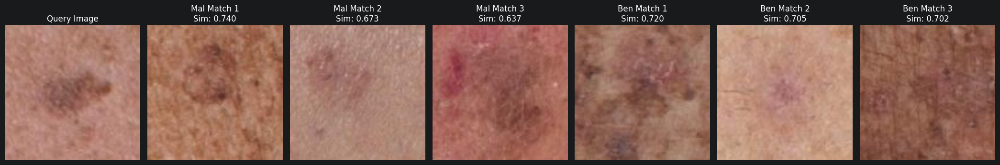

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3467445""","""IP_8683966""",50.0,"""male""","""head/neck""",7.6,25.08913,0.8007054,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_7464445""","""IP_7834081""",45.0,"""male""","""upper extremity""",4.8,7.243385,0.887445,0.740082
"""ISIC_7105211""","""IP_9978624""",55.0,"""female""","""lower extremity""",1.59,1.013323,0.8710382,0.672858
"""ISIC_6242031""","""IP_2084621""",80.0,"""male""","""head/neck""",16.07,78.795271,0.893438,0.637231


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9113429""","""IP_7797815""",75.0,"""male""","""anterior torso""",4.06,9.757928,0.3759401,0.720208
"""ISIC_4339665""","""IP_2385829""",50.0,"""female""","""lower extremity""",2.68,4.597485,0.609151,0.704776
"""ISIC_0783675""","""IP_7797815""",75.0,"""male""","""anterior torso""",4.26,7.168324,0.8307134,0.702033


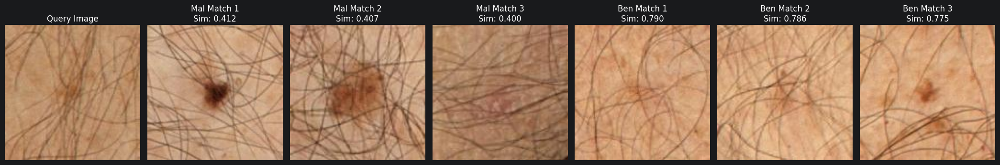

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0051897""","""IP_5516884""",60.0,"""male""","""upper extremity""",4.6,6.192531,0.9049373,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1662809""","""IP_6611217""",55.0,"""male""","""anterior torso""",4.21,10.54607,0.5072653,0.412166
"""ISIC_0554252""","""IP_7411721""",45.0,"""male""","""anterior torso""",7.38,32.37005,0.6437153,0.406849
"""ISIC_3091180""","""IP_0698187""",60.0,"""male""","""upper extremity""",1.53,1.576281,0.674284,0.400121


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_1472513""","""IP_4540594""",65.0,"""male""","""upper extremity""",2.9,3.565397,0.806427,0.789952
"""ISIC_7504729""","""IP_4111386""",65.0,"""male""","""anterior torso""",3.1,4.653781,0.724903,0.786203
"""ISIC_3449431""","""IP_0658218""",75.0,"""male""","""anterior torso""",2.7,5.010321,0.480177,0.774535


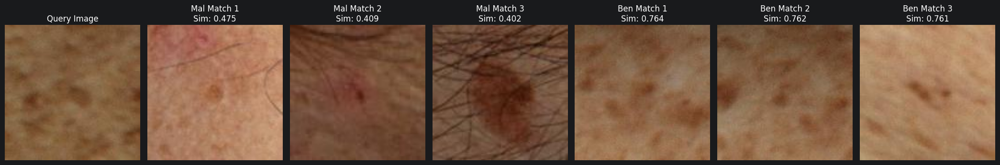

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0051958""","""IP_9726832""",85.0,"""male""","""posterior torso""",3.56,7.036968,0.7339323,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.475107
"""ISIC_3631780""","""IP_1092190""",65.0,"""female""","""head/neck""",2.36,2.158003,0.898866,0.408563
"""ISIC_0445144""","""IP_0822819""",60.0,"""male""","""head/neck""",9.2,32.370051,0.783424,0.402432


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0359646""","""IP_5714646""",40.0,"""male""","""posterior torso""",3.89,5.122912,0.8901177,0.763931
"""ISIC_3712617""","""IP_5714646""",40.0,"""male""","""posterior torso""",3.59,3.82811,0.930178,0.762357
"""ISIC_5404186""","""IP_1974761""",75.0,"""male""","""anterior torso""",4.0,6.624132,0.795843,0.760957


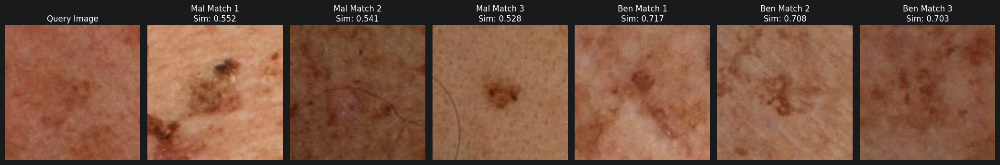

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0052094""","""IP_9179679""",70.0,"""male""","""head/neck""",3.95,7.918934,0.471671,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8363981""","""IP_5426188""",65.0,"""male""","""posterior torso""",8.09,24.7326,0.754711,0.552112
"""ISIC_3481735""","""IP_0658218""",75.0,"""male""","""posterior torso""",1.35,0.994558,0.792037,0.540541
"""ISIC_2263885""","""IP_1241473""",35.0,"""male""","""head/neck""",4.2,12.310002,0.435852,0.528084


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5522733""","""IP_1117889""",55.0,"""female""","""lower extremity""",8.56,17.376619,0.847138,0.71746
"""ISIC_2045236""","""IP_5727892""",55.0,"""male""","""posterior torso""",6.68,17.20773,0.6992472,0.707711
"""ISIC_2455017""","""IP_5539318""",70.0,"""female""","""upper extremity""",2.59,3.002439,0.8140274,0.703449


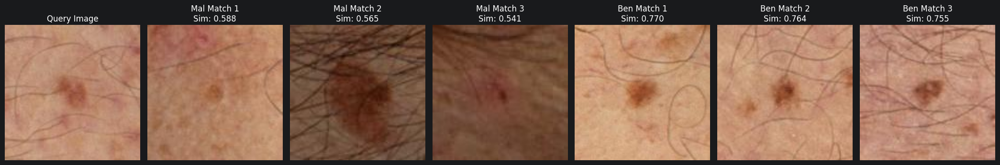

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073511""","""IP_3371534""",60.0,"""male""","""lower extremity""",4.17,8.969788,0.762354,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.587919
"""ISIC_0445144""","""IP_0822819""",60.0,"""male""","""head/neck""",9.2,32.370051,0.783424,0.565059
"""ISIC_3631780""","""IP_1092190""",65.0,"""female""","""head/neck""",2.36,2.158003,0.898866,0.541486


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6008199""","""IP_4150126""",65.0,"""male""","""upper extremity""",3.78,8.932257,0.596188,0.769891
"""ISIC_7530902""","""IP_0218255""",65.0,"""male""","""lower extremity""",3.32,8.256709,0.360366,0.763749
"""ISIC_9375612""","""IP_3260480""",50.0,"""male""","""lower extremity""",4.03,7.862638,0.687247,0.754884


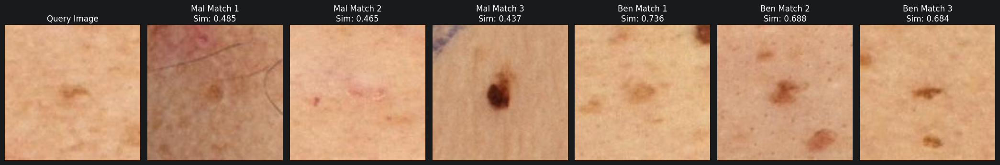

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073555""","""IP_3371534""",60.0,"""male""","""posterior torso""",2.76,3.490336,0.839144,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.485105
"""ISIC_4907011""","""IP_5709986""",65.0,"""female""","""posterior torso""",1.47,0.8819666,0.9109259,0.46454
"""ISIC_2068746""","""IP_1474479""",70.0,"""male""","""upper extremity""",5.3,13.098142,0.785371,0.437201


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_5770170""","""IP_6882635""",55.0,"""male""","""posterior torso""",2.6,3.846876,0.7137955,0.73594
"""ISIC_1809505""","""IP_7527140""",45.0,"""female""","""posterior torso""",3.27,7.412272,0.6565652,0.687937
"""ISIC_4959687""","""IP_7607582""",60.0,"""female""","""posterior torso""",3.7,4.710077,0.8889769,0.683774


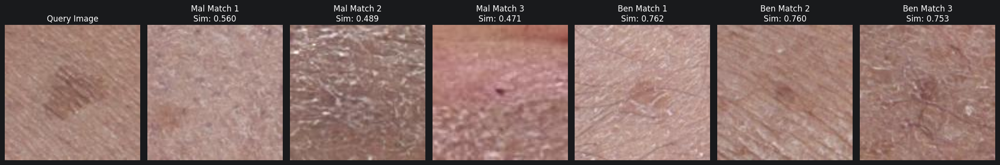

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073777""","""IP_4905048""",45.0,"""female""","""lower extremity""",6.34,23.531619,0.475515,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3964079""","""IP_1039004""",80.0,"""female""","""lower extremity""",1.07,0.731845,0.689718,0.560484
"""ISIC_6465391""","""IP_7272992""",70.0,"""male""","""lower extremity""",1.7,1.276037,0.8522039,0.488763
"""ISIC_4927574""","""IP_3537591""",45.0,"""male""","""head/neck""",1.25,0.769375,0.784206,0.470584


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9492784""","""IP_3798501""",60.0,"""male""","""lower extremity""",2.74,4.878964,0.573355,0.761888
"""ISIC_7695229""","""IP_9057861""",80.0,"""male""","""lower extremity""",2.58,3.208857,0.8080606,0.759838
"""ISIC_4315235""","""IP_6569660""",65.0,"""male""","""lower extremity""",3.1,4.259711,0.8303368,0.753114


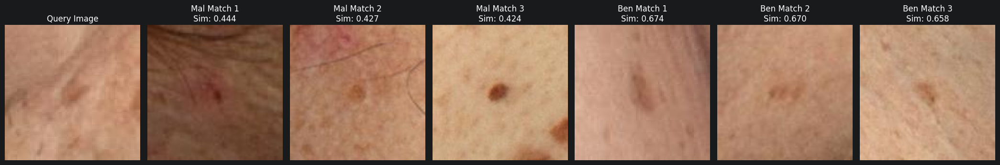

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073877""","""IP_3921915""",50.0,"""male""","""upper extremity""",4.11,4.710077,0.938472,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3631780""","""IP_1092190""",65.0,"""female""","""head/neck""",2.36,2.158003,0.898866,0.443573
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.427147
"""ISIC_3266736""","""IP_6321403""",60.0,"""male""","""upper extremity""",3.01,5.479452,0.6577945,0.42403


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3884038""","""IP_9978624""",55.0,"""female""","""anterior torso""",3.49,5.835992,0.8421602,0.674141
"""ISIC_8325179""","""IP_1479335""",40.0,"""female""","""head/neck""",3.8,4.14712,0.940679,0.669945
"""ISIC_6458984""","""IP_7259384""",45.0,"""male""","""anterior torso""",2.91,3.565397,0.8480677,0.657611


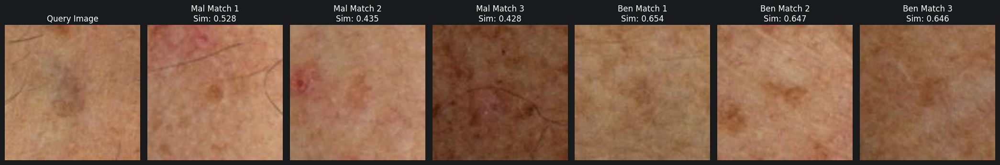

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0073944""","""IP_6863831""",60.0,"""male""","""lower extremity""",4.84,8.275474,0.8786305,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.528119
"""ISIC_5193169""","""IP_1715157""",60.0,"""male""","""posterior torso""",3.87,5.197973,0.89134,0.434525
"""ISIC_3481735""","""IP_0658218""",75.0,"""male""","""posterior torso""",1.35,0.994558,0.792037,0.427839


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_8751097""","""IP_3144881""",60.0,"""female""","""upper extremity""",2.62,4.728842,0.606732,0.654011
"""ISIC_6392990""","""IP_6598006""",75.0,"""male""","""anterior torso""",5.08,8.33177,0.9129042,0.646956
"""ISIC_2710119""","""IP_1474479""",70.0,"""male""","""upper extremity""",3.4,4.597485,0.856114,0.646495


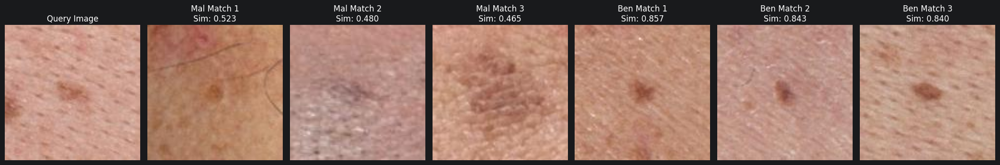

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0074460""","""IP_7152379""",55.0,"""male""","""posterior torso""",3.83,6.323888,0.8581613,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.523434
"""ISIC_5985180""","""IP_9801595""",60.0,"""male""","""head/neck""",2.7,4.109589,0.5925312,0.479763
"""ISIC_8852993""","""IP_9743101""",50.0,"""male""","""posterior torso""",11.72,71.17658,0.6716789,0.464828


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_9879818""","""IP_8313778""",55.0,"""male""","""posterior torso""",2.52,4.259711,0.5715748,0.857294
"""ISIC_3648102""","""IP_8172184""",75.0,"""male""","""posterior torso""",2.93,4.14712,0.7941651,0.843298
"""ISIC_8438566""","""IP_9299752""",75.0,"""male""","""posterior torso""",3.42,5.554513,0.8148804,0.839891


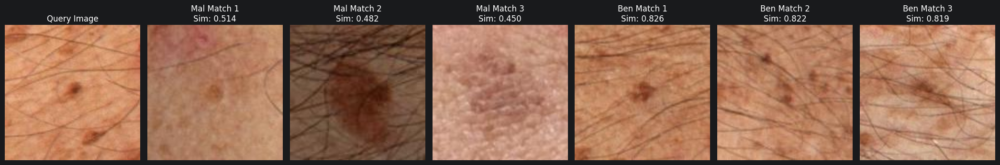

isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_0074664""","""IP_9179679""",70.0,"""male""","""posterior torso""",3.01,4.034528,0.8523205,1.0


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_6249729""","""IP_0973797""",65.0,"""male""","""anterior torso""",1.74,2.25183,0.401645,0.514248
"""ISIC_0445144""","""IP_0822819""",60.0,"""male""","""head/neck""",9.2,32.370051,0.783424,0.48219
"""ISIC_8852993""","""IP_9743101""",50.0,"""male""","""posterior torso""",11.72,71.17658,0.6716789,0.449581


isic_id,patient_id,age_approx,sex,anatom_site_general,clin_size_long_diam_mm,tbp_lv_areaMM2,tbp_lv_eccentricity,similarity
str,str,f64,str,str,f64,f64,f64,f64
"""ISIC_3464975""","""IP_7541961""",60.0,"""male""","""upper extremity""",2.76,5.254269,0.4809428,0.825641
"""ISIC_5329350""","""IP_5714646""",40.0,"""male""","""lower extremity""",2.88,3.865641,0.8222426,0.821967
"""ISIC_0300989""","""IP_5714646""",40.0,"""male""","""lower extremity""",5.19,8.294239,0.9118194,0.818761


In [25]:
full_model = MultimodalModel(tab_dim=len(tab_features)).to(device)
full_model.load_state_dict(torch.load(model_path / "best_hard_neg_model.pt", weights_only=True))
full_model.eval()

val_mal_indices = [i for i, m in enumerate(val_malignant) if m == 1][:10]
val_ben_indices = [i for i, m in enumerate(val_malignant) if m == 0][:10]
query_indices = val_mal_indices + val_ben_indices

for q_idx in query_indices:
    query_emb = val_embeddings[q_idx].reshape(1, -1)

    D_mal, I_mal = index_mal.search(query_emb, 3)
    D_ben, I_ben = index_ben.search(query_emb, 3)

    q_row = val_df.row(q_idx, named=True)
    gt_class = "Malignant" if q_row["malignant"] == 1 else "Benign"

    img = Image.open(q_row['image_path']).convert("RGB")
    img_tensor = val_transform(img).unsqueeze(0).to(device)
    tab_tensor = torch.tensor([[q_row[feat] for feat in tab_features]], dtype=torch.float32).to(device)

    with torch.no_grad():
        logit = full_model(img_tensor, tab_tensor)
        prob = torch.sigmoid(logit).item()

    display(HTML(f"<h3>Query: {q_row['isic_id']} | Ground Truth: {gt_class} | Predicted Probability: {prob:.4f}</h3>"))

    fig, axes = plt.subplots(1, 7, figsize=(21, 4))

    axes[0].imshow(img)
    axes[0].set_title("Query Image")
    axes[0].axis('off')

    for i in range(3):
        m_row = mal_train_df.row(I_mal[0][i], named=True)
        axes[i+1].imshow(Image.open(m_row['image_path']))
        axes[i+1].set_title(f"Mal Match {i+1}\nSim: {D_mal[0][i]:.3f}")
        axes[i+1].axis('off')

    for i in range(3):
        b_row = ben_train_df.row(I_ben[0][i], named=True)
        axes[i+4].imshow(Image.open(b_row['image_path']))
        axes[i+4].set_title(f"Ben Match {i+1}\nSim: {D_ben[0][i]:.3f}")
        axes[i+4].axis('off')

    plt.tight_layout()
    plt.show()

    display_cols = [
        "isic_id", "patient_id", "age_approx", "sex", "anatom_site_general",
        "clin_size_long_diam_mm", "tbp_lv_areaMM2", "tbp_lv_eccentricity"
    ]

    def get_ordered_raw_table(isic_ids, sims):
        ordered_df = pl.DataFrame({"isic_id": isic_ids, "similarity": sims})
        raw_features = df.select(display_cols)
        result = ordered_df.join(raw_features, on="isic_id", how="left", maintain_order="left")

        result = result.with_columns(
            pl.col("age_approx").fill_null(median_age),
            pl.col("sex").fill_null(mode_sex),
            pl.col("anatom_site_general").fill_null("unknown")
        )

        cols = [c for c in result.columns if c != "similarity"] + ["similarity"]
        return result.select(cols)

    q_table = get_ordered_raw_table([q_row['isic_id']], [1.0])
    display(HTML("<b>Query Tabular Data:</b>"))
    display(q_table)

    mal_ids = I_mal[0].tolist()
    mal_sims = D_mal[0].tolist()
    mal_isic_ids = mal_train_df.gather(mal_ids)["isic_id"].to_list()
    mal_table = get_ordered_raw_table(mal_isic_ids, mal_sims)
    display(HTML("<b>Top 3 Malignant Matches:</b>"))
    display(mal_table)

    ben_ids = I_ben[0].tolist()
    ben_sims = D_ben[0].tolist()
    ben_isic_ids = ben_train_df.gather(ben_ids)["isic_id"].to_list()
    ben_table = get_ordered_raw_table(ben_isic_ids, ben_sims)
    display(HTML("<b>Top 3 Benign Matches:</b>"))
    display(ben_table)

    display(HTML("<hr>"))